In [42]:
import pandas as pd
import numpy as np
import psycopg2
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from psycopg2 import sql
from sqlalchemy import create_engine
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.linear_model import LinearRegression
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load Datas

In [3]:
connection_params = {
  "host": "localhost",
  "user": "postgres",
  "password": "post33##",
  "port": "5432"
}
db_name = 'telecom'
connection_params["database"] = db_name
engine = create_engine(f"postgresql+psycopg2://{connection_params['user']}:{connection_params['password']}@{connection_params['host']}:{connection_params['port']}/{connection_params['database']}")
db_conn = engine.connect()


In [5]:
#Load User Experience Data From DB
user_experience_df = pd.read_sql("select * from \"user_experience\"", db_conn);
user_experience_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105716 entries, 0 to 105715
Data columns (total 5 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   MSISDN/Number                   105716 non-null  int64  
 1   cluster                         105716 non-null  int64  
 2   Avg RTT Total (ms)              105716 non-null  float64
 3   Avg Bearer TP Total (kbps)      105716 non-null  float64
 4   TCP Retrans. Vol Total (Bytes)  105716 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 4.0 MB


In [19]:
#Load User Engagement Data From DB
user_engagement_df = pd.read_sql("select * from \"user_engagement\"", db_conn);
user_engagement_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105716 entries, 0 to 105715
Data columns (total 5 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   MSISDN/Number              105716 non-null  int64  
 1   cluster                    105716 non-null  int64  
 2   xDR Sessions               105716 non-null  float64
 3   Dur (ms)                   105716 non-null  float64
 4   Data_Volume_Total (Bytes)  105716 non-null  float64
dtypes: float64(3), int64(2)
memory usage: 4.0 MB


# Load Models

In [12]:
#Load User Engagement model
with open("../models/user_engagement.pkl", "rb") as f:
    user_engagement_model = pickle.load(f)

In [9]:
#Load User Experience model
with open("../models/user_experience.pkl", "rb") as f:
    user_experience_model = pickle.load(f)

### Engagement Score

In [14]:
engagement_df = user_engagemenet_df.set_index('MSISDN/Number')[
    ['xDR Sessions', 'Dur (ms)', 'Data_Volume_Total (Bytes)']]

In [16]:
#Scale Data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(engagement_df)
scaled_data

array([[-0.54866182, -0.14578281,  0.54827419],
       [-0.54866182,  0.6146225 , -1.28049119],
       [-0.54866182,  0.0693255 , -0.16800992],
       ...,
       [-0.54866182, -1.41773868,  0.13265469],
       [-0.54866182,  0.14027633, -0.46103345],
       [-0.54866182,  1.3675591 , -0.1671958 ]])

In [17]:
#Normalize data
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69518453, -0.1847148 ,  0.69469339],
       [-0.36033465,  0.40365445, -0.84096493],
       [-0.94927152,  0.11994406, -0.29068368],
       ...,
       [-0.35954757, -0.92906865,  0.08693091],
       [-0.75133844,  0.19209465, -0.63134   ],
       [-0.36997482,  0.9221754 , -0.11274383]])

In [20]:
less_engaged_cluster = 5
distance = user_engagement_model.fit_transform(normalized_data)
distance_from_less_engaged_cluster = list(
    map(lambda x: x[less_engaged_cluster], distance))
user_engagement_df['engagement_score'] = distance_from_less_engaged_cluster
user_engagement_df.head()

C:\Users\Fandingo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,MSISDN/Number,cluster,xDR Sessions,Dur (ms),Data_Volume_Total (Bytes),engagement_score
0,33601001722,5,1.0,116720140.0,8.786906e+08,0.721749
1,33601001754,4,1.0,181230963.0,1.568596e+08,1.533582
2,33601002511,4,1.0,134969374.0,5.959665e+08,1.023912
3,33601007832,1,1.0,49878024.0,4.223207e+08,0.706912
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.181411


### Experience Score

In [28]:
df_experience = user_experience_df.set_index('MSISDN/Number')[
    ['Avg RTT Total (ms)', 'Avg Bearer TP Total (kbps)', 'TCP Retrans. Vol Total (Bytes)']]

In [29]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_experience)
scaled_data

array([[-0.65952504, -0.67835113,  0.07920927],
       [-0.93056783, -0.67723988,  1.48635664],
       [-0.4246213 , -0.67733651,  0.44785616],
       ...,
       [-0.55110793, -0.18123297, -0.70722444],
       [-0.76794216, -0.67641851, -0.69843053],
       [-0.40655178, -0.6804287 , -0.73584885]])

In [30]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69465741, -0.71448635,  0.08342868],
       [-0.49502025, -0.36026117,  0.79067492],
       [-0.46339275, -0.73918295,  0.48874914],
       ...,
       [-0.60248125, -0.1981272 , -0.77315067],
       [-0.61981584, -0.54594595, -0.56371212],
       [-0.37589885, -0.62912617, -0.68036779]])

In [31]:
worst_experience_cluster = 1
distance = user_experience_model.fit_transform(normalized_data)
distance_from_worst_experience_cluster = list(
    map(lambda x: x[worst_experience_cluster], distance))
user_experience_df['experience_score'] = distance_from_worst_experience_cluster
user_experience_df.head()

C:\Users\Fandingo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


,MSISDN/Number,experience_cluster,Avg RTT Total (ms),Avg Bearer TP Total (kbps),TCP Retrans. Vol Total (Bytes),experience_score
0,33601001722,1,46.0,76.0,2895381.0,0.743908
1,33601001754,2,31.0,99.0,7685875.5,1.357409
2,33601002511,2,59.0,97.0,4150403.0,1.071889
3,33601007832,1,84.0,248.0,2396.0,0.470910
4,33601008617,0,119.0,43204.5,8047304.5,1.830707


### Satifcation Score

In [32]:
#Rename Column
user_engagement_df.rename(columns={'cluster': 'engagement_cluster'}, inplace=True)
user_engagement_df.head()

,MSISDN/Number,engagement_cluster,xDR Sessions,Dur (ms),Data_Volume_Total (Bytes),engagement_score
0,33601001722,5,1.0,116720140.0,8.786906e+08,0.721749
1,33601001754,4,1.0,181230963.0,1.568596e+08,1.533582
2,33601002511,4,1.0,134969374.0,5.959665e+08,1.023912
3,33601007832,1,1.0,49878024.0,4.223207e+08,0.706912
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.181411


In [33]:
#Rename Column
user_experience_df.rename(columns={'cluster': 'experience_cluster'}, inplace=True)
user_experience_df.head()

,MSISDN/Number,experience_cluster,Avg RTT Total (ms),Avg Bearer TP Total (kbps),TCP Retrans. Vol Total (Bytes),experience_score
0,33601001722,1,46.0,76.0,2895381.0,0.743908
1,33601001754,2,31.0,99.0,7685875.5,1.357409
2,33601002511,2,59.0,97.0,4150403.0,1.071889
3,33601007832,1,84.0,248.0,2396.0,0.470910
4,33601008617,0,119.0,43204.5,8047304.5,1.830707


In [34]:
user_satisfaction_df = pd.merge(user_engagement_df, user_experience_df, on='MSISDN/Number')
user_satisfaction_df['satisfaction_score'] = (
    user_satisfaction_df['engagement_score'] + user_satisfaction_df['experience_score'])/2
user_satisfaction_df.head()

,MSISDN/Number,engagement_cluster,xDR Sessions,Dur (ms),Data_Volume_Total (Bytes),engagement_score,experience_cluster,Avg RTT Total (ms),Avg Bearer TP Total (kbps),TCP Retrans. Vol Total (Bytes),experience_score,satisfaction_score
0,33601001722,5,1.0,116720140.0,8.786906e+08,0.721749,1,46.0,76.0,2895381.0,0.743908,0.732829
1,33601001754,4,1.0,181230963.0,1.568596e+08,1.533582,2,31.0,99.0,7685875.5,1.357409,1.445495
2,33601002511,4,1.0,134969374.0,5.959665e+08,1.023912,2,59.0,97.0,4150403.0,1.071889,1.047901
3,33601007832,1,1.0,49878024.0,4.223207e+08,0.706912,1,84.0,248.0,2396.0,0.470910,0.588911
4,33601008617,0,2.0,37104453.0,1.457411e+09,1.181411,0,119.0,43204.5,8047304.5,1.830707,1.506059


In [36]:
user_satisfaction_df = user_satisfaction_df[['MSISDN/Number', 'engagement_score',
                        'experience_score', 'satisfaction_score']]
user_satisfaction_df.set_index('MSISDN/Number', inplace=True)
user_satisfaction_df.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,0.721749,0.743908,0.732829
33601001754,1.533582,1.357409,1.445495
33601002511,1.023912,1.071889,1.047901
33601007832,0.706912,0.470910,0.588911
33601008617,1.181411,1.830707,1.506059


In [37]:
top10_satisfied = user_satisfaction_df.sort_values('satisfaction_score', ascending=False).head(10)
top10_satisfied

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33699790014,1.929391,1.832283,1.880837
33650033888,1.924106,1.833841,1.878974
33781674784,1.921417,1.835181,1.878299
33665236895,1.920505,1.835999,1.878252
33668559246,1.924480,1.830787,1.877634
33661625785,1.928199,1.826919,1.877559
33781415946,1.931355,1.823763,1.877559
33659642870,1.919603,1.833806,1.876704
33650083944,1.924660,1.827184,1.875922


### Satisfaction Score Prediction using Linear Regression

In [43]:
X = user_satisfaction_df[['engagement_score', 'experience_score']]
y = user_satisfaction_df[['satisfaction_score']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
#Splitting training and testing data
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)
y_pred = regression_model.predict(X_test)

print(f'Intercept: {regression_model.intercept_}')
print(f'Coefficients: { regression_model.coef_}')
print(f"Mean squared error: {np.mean((y_pred - y_test.values) ** 2)}")

Intercept: [-4.4408921e-16]
Coefficients: [[0.5 0.5]]
Mean squared error: 1.9802079040811727e-30


In [44]:
#Check for outliers
df_copy = user_satisfaction_df.copy(deep=True)
df_copy.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,0.721749,0.743908,0.732829
33601001754,1.533582,1.357409,1.445495
33601002511,1.023912,1.071889,1.047901
33601007832,0.706912,0.470910,0.588911
33601008617,1.181411,1.830707,1.506059


In [45]:
df_copy = df_copy[['engagement_score', 'experience_score']]
df_copy.head()

,engagement_score,experience_score
MSISDN/Number,,
33601001722,0.721749,0.743908
33601001754,1.533582,1.357409
33601002511,1.023912,1.071889
33601007832,0.706912,0.470910
33601008617,1.181411,1.830707


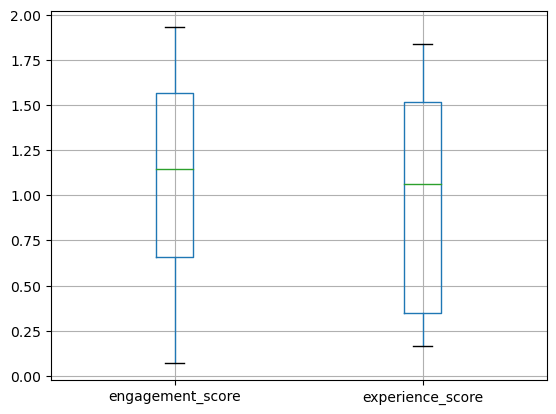

In [46]:
df_copy.boxplot();

In [47]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_copy)
scaled_data

array([[-0.71963834, -0.41278441],
       [ 0.82350127,  0.63482361],
       [-0.14528333,  0.14727203],
       ...,
       [-1.44626826, -0.92717934],
       [ 0.249434  , -1.25357616],
       [ 1.07340276, -1.38016196]])

In [48]:
kmeans = KMeans(n_clusters=2, random_state=1).fit(normalized_data)
kmeans.labels_

C:\Users\Fandingo\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([0, 1, 0, ..., 0, 0, 0])

In [50]:
user_satisfaction_df.insert(0, 'satisfaction_cluster', kmeans.labels_)
user_satisfaction_df

,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,,
33601001722,0,0.721749,0.743908,0.732829
33601001754,1,1.533582,1.357409,1.445495
33601002511,0,1.023912,1.071889,1.047901
33601007832,0,0.706912,0.470910,0.588911
33601008617,1,1.181411,1.830707,1.506059
...,...,...,...,...
33789967113,0,1.458003,0.164915,0.811459
33789980299,1,1.741388,1.816318,1.778853
33789996170,0,0.339476,0.442668,0.391072


In [51]:
user_satisfaction_df['satisfaction_cluster'].value_counts()

satisfaction_cluster
0    56969
1    48747
Name: count, dtype: int64

In [52]:
pio.renderers.default = "notebook"
fig = px.scatter(user_satisfaction_df, x='engagement_score', y='experience_score',
                 color='satisfaction_cluster', size='satisfaction_score')
fig.show()

In [53]:
#Average Satisfaction & Experience Score per Cluster
user_satisfaction_df.groupby('satisfaction_cluster').agg(
    {'satisfaction_score': 'mean', 'experience_score': 'mean'})

,satisfaction_score,experience_score
satisfaction_cluster,,
0,0.767911,0.500858
1,1.364475,1.552197


In [54]:
# Wrtite User Experience Data to DB
try:
    print('writing to the database')
    frame = user_satisfaction_df.to_sql(
        "user_satisfaction", con=engine, if_exists='replace')
    print('successful')
except Exception as e:
  print("Error writing to database: ", e)

writing to the database
successful
